### Offshore DAS Preprocessing

Author: Benz Poobua (spoobua@stanford.edu)

Reference: Williams, E. F., Fernández-Ruiz, M. R., Magalhaes, R., Vanthillo, R., Zhan, Z., González-Herráez, M., & Martins, H. F. (2021). Scholte wave inversion and passive source imaging with ocean-bottom DAS. The Leading Edge, 40(8), 576-583.doi: https://doi.org/10.1190/tle40080576.1

In [1]:
# Import necessary dependencies
import os
import sys
import torch
import numpy as np
import matplotlib.pyplot as plt

from pathlib import Path
from scipy.signal import detrend
from scipy.signal import welch

sys.path.append('..')

from src.utils import nextpow2
from src.ani import bandpass_filter_tukey, temporal_normalization, spectral_whitening

In [2]:
# Define paths
das_path1 = os.path.join('..', 'data', 'raw_offshore', '20180819_win0000_offshore.npz')
das_path2 = os.path.join('..', 'data', 'raw_offshore', '20180819_win0001_offshore.npz')
das_path3= os.path.join('..', 'data', 'raw_offshore', '20180819_win0002_offshore.npz')
das_path4 = os.path.join('..', 'data', 'raw_offshore', '20180819_win0003_offshore.npz')

das_paths = [das_path1, das_path2, das_path3, das_path4]

In [3]:
# Load das data
das_data = np.load(das_path1)

# Inspect variables inside 
for key in das_data:
    print(f'{key}')

data
dt
start_sample
end_sample


In [4]:
# Extract das data and metadata
das_array = das_data['data']
dt = float(das_data['dt'])           # Sampling interval in seconds
N = das_array.shape[1]               # Number of time samples
num_channels = das_array.shape[0]    # Number of channels

# Create t_axis and x_axis ON THE FLY
dx = 10.0                            # Channel spacing from the paper/yaml
t_axis = np.arange(N) * dt           # Time in seconds (from 0 to 204.8)
x_axis = np.arange(num_channels) * dx / 1000.0  # Distance in km

print(f"DAS array shape: {das_array.shape} (Channels x Time)")
print(f"Time axis shape: {t_axis.shape}")
print(f"Channel axis shape: {x_axis.shape}")
print(f"Total duration: {(N * dt) / 60:.2f} minutes")

DAS array shape: (3192, 2048) (Channels x Time)
Time axis shape: (2048,)
Channel axis shape: (3192,)
Total duration: 3.41 minutes


#### 1. DAS Visualization and the Space-Time Domain

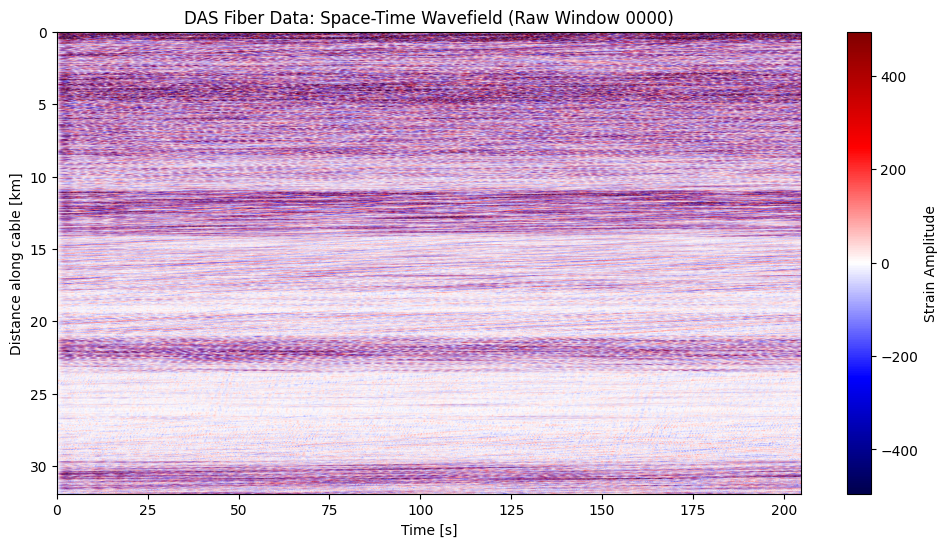

In [5]:
# Compute clipping value to avoid extreme outliers in the colormap
pclip = 99
das_clip = np.percentile(np.abs(das_array), pclip)

# Plot all channels as a heatmap
plt.figure(figsize=(12, 6))
plt.imshow(das_array, aspect='auto',
           extent=[t_axis[0], t_axis[-1], x_axis[-1], x_axis[0]],
           vmin=-das_clip, vmax=das_clip,
           cmap='seismic')

plt.colorbar(label='Strain Amplitude')
plt.xlabel('Time [s]')
plt.ylabel('Distance along cable [km]')
plt.title('DAS Fiber Data: Space-Time Wavefield (Raw Window 0000)')
plt.show()

#### 2. Frequency Analysis: The Space-Frequency Domain

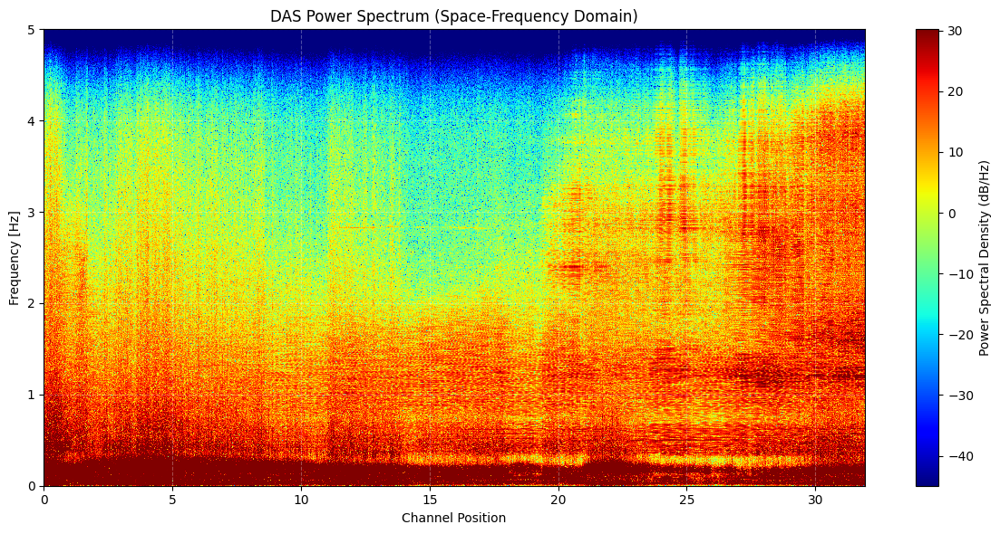

In [6]:
# 1. Compute Power Spectral Density (PSD) using Welch's method
fs = 1.0 / dt  # Sampling frequency (250 Hz)

# nperseg controls the frequency resolution. Higher = finer frequency, but more variance.
# 2048 samples at 250 Hz gives a frequency resolution of ~0.12 Hz
freqs, psd = welch(das_array, fs=fs, nperseg=2048, axis=-1)

# Convert to Decibels (dB). We add a tiny epsilon (1e-12) to avoid log(0)
power_db = 10 * np.log10(psd + 1e-12)

# 2. Plotting the Power Spectrum 
# Define the frequency range we actually care about (e.g., 0 to 25 Hz)
fmin, fmax = 0, 5  
freq_mask = (freqs >= fmin) & (freqs <= fmax)

freqs_plot = freqs[freq_mask]
power_plot = power_db[:, freq_mask]

# Create a meshgrid for pcolormesh
X, Y = np.meshgrid(x_axis, freqs_plot)

# Calculate color limits (e.g., 5th and 95th percentiles to drop extreme outliers)
vmin = np.percentile(power_plot, 5)
vmax = np.percentile(power_plot, 95)

plt.figure(figsize=(12, 6))
# Transpose power_plot (.T) so the axes align: (len(freqs_plot), len(channels))
mesh = plt.pcolormesh(X, Y, power_plot.T, cmap='jet', shading='auto', vmin=vmin, vmax=vmax)

plt.colorbar(mesh, label='Power Spectral Density (dB/Hz)')
plt.ylim(fmin, fmax)
plt.xlabel('Channel Position')
plt.ylabel('Frequency [Hz]')
plt.title('DAS Power Spectrum (Space-Frequency Domain)')

plt.grid(True, which='both', color='white', linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

#### 3. DAS Processing

In [ ]:
# Set preprocessing parameters
f1, f2          = 1, 4.99    # bandpass filter corners
Decimation      = 1          # if not 1, decimation factor after filtering
diff = False                 # whether to differentiate 
# min_length = 60            # length of the segment in preprocessing, in sec, if shorter than this length, skip the file

##### 3.1 Detrend

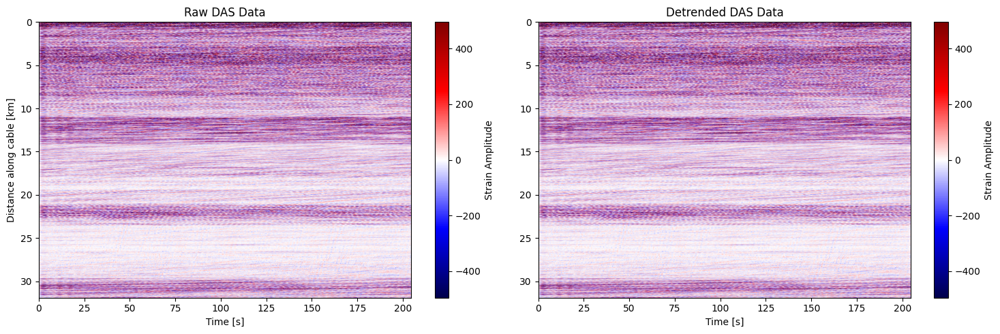

In [8]:
# Remove the linear trend along the time axis (axis=-1)
x_detrended = detrend(das_array, axis=-1)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# 1. Raw DAS
im1 = ax1.imshow(das_array, aspect='auto', 
                 extent=[t_axis[0], t_axis[-1], x_axis[-1], x_axis[0]], 
                 vmin=-das_clip, vmax=das_clip, cmap='seismic')
ax1.set_title("Raw DAS Data")
ax1.set_xlabel("Time [s]")
ax1.set_ylabel("Distance along cable [km]")
fig.colorbar(im1, ax=ax1, label="Strain Amplitude")

# 2. Detrended DAS
im2 = ax2.imshow(x_detrended, aspect='auto', 
                 extent=[t_axis[0], t_axis[-1], x_axis[-1], x_axis[0]], 
                 vmin=-das_clip, vmax=das_clip, cmap='seismic')
ax2.set_title("Detrended DAS Data")
ax2.set_xlabel("Time [s]")
fig.colorbar(im2, ax=ax2, label="Strain Amplitude")

plt.tight_layout()
plt.show()

##### 3.2 Tukey-windowed bandpass filter

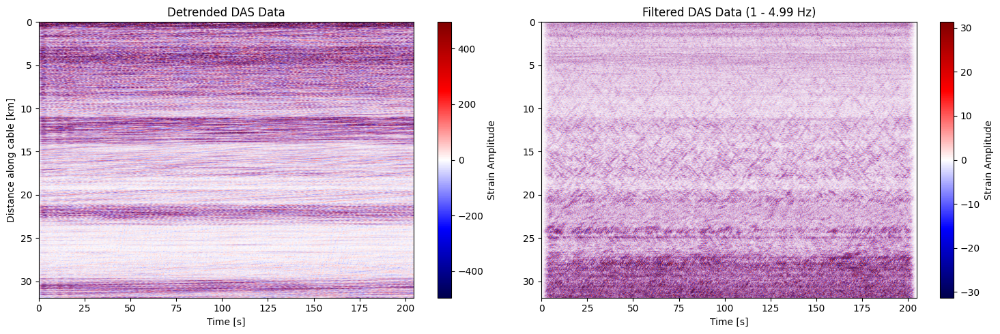

In [ ]:
# Apply Tukey window and Butterworth bandpass filter
x_filtered = bandpass_filter_tukey(x_detrended, fs=fs, f1=f1, f2=f2, alpha=0.05, order=4)

# Calculate a separate clip for the filtered data (Scholte waves are much quieter)
filtered_clip = np.percentile(np.abs(x_filtered), 99)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# 1. Detrended DAS (Uses the large das_clip)
im1 = ax1.imshow(x_detrended, aspect='auto', 
                 extent=[t_axis[0], t_axis[-1], x_axis[-1], x_axis[0]],
                 vmin=-das_clip, vmax=das_clip, cmap='seismic')
ax1.set_title("Detrended DAS Data")
ax1.set_xlabel("Time [s]")
ax1.set_ylabel("Distance along cable [km]")
fig.colorbar(im1, ax=ax1, label="Strain Amplitude")

# 2. Filtered DAS (Uses the smaller filtered_clip)
im2 = ax2.imshow(x_filtered, aspect='auto', 
                 extent=[t_axis[0], t_axis[-1], x_axis[-1], x_axis[0]],
                 vmin=-filtered_clip, vmax=filtered_clip, cmap='seismic') 
ax2.set_title(f"Filtered DAS Data ({f1} - {f2} Hz)")
ax2.set_xlabel("Time [s]")
fig.colorbar(im2, ax=ax2, label="Strain Amplitude")

plt.tight_layout()
plt.show()

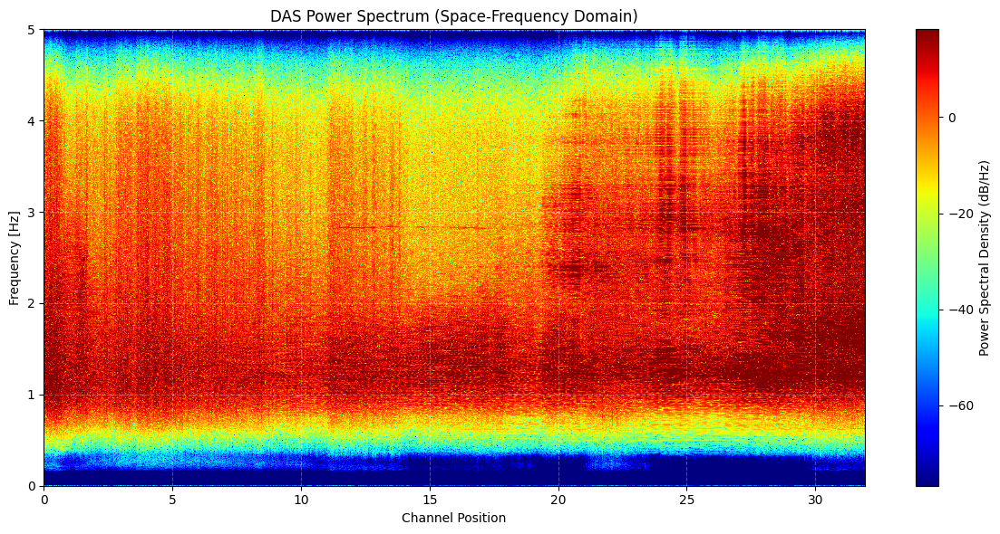

In [10]:
freqs, psd = welch(x_filtered, fs=fs, nperseg=2048, axis=-1)

# Convert to Decibels (dB). We add a tiny epsilon (1e-12) to avoid log(0)
power_db = 10 * np.log10(psd + 1e-12)

fmin, fmax = 0, 5  
freq_mask = (freqs >= fmin) & (freqs <= fmax)

freqs_plot = freqs[freq_mask]
power_plot = power_db[:, freq_mask]

# Create a meshgrid for pcolormesh
X, Y = np.meshgrid(x_axis, freqs_plot)

# Calculate color limits (e.g., 5th and 95th percentiles to drop extreme outliers)
vmin = np.percentile(power_plot, 5)
vmax = np.percentile(power_plot, 95)

plt.figure(figsize=(12, 6))
# Transpose power_plot (.T) so the axes align: (len(freqs_plot), len(channels))
mesh = plt.pcolormesh(X, Y, power_plot.T, cmap='jet', shading='auto', vmin=vmin, vmax=vmax)

plt.colorbar(mesh, label='Power Spectral Density (dB/Hz)')
plt.ylim(fmin, fmax)
plt.xlabel('Channel Position')
plt.ylabel('Frequency [Hz]')
plt.title('DAS Power Spectrum (Space-Frequency Domain)')

plt.grid(True, which='both', color='white', linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

##### 3.3 Common mode noise

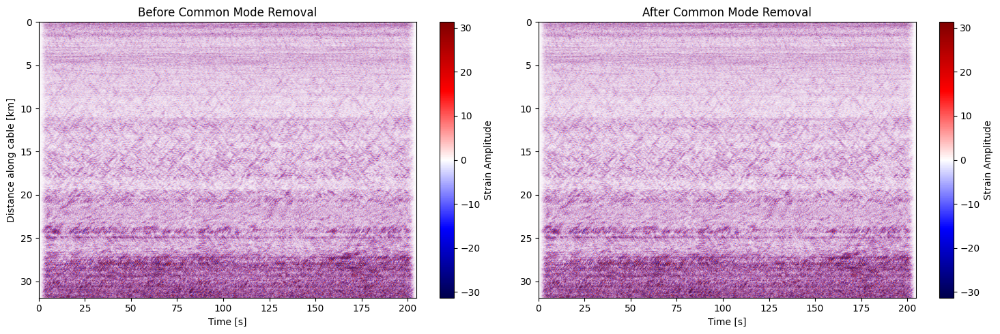

In [11]:
# Calculate spatial median (axis=0) and subtract it from all channels
x_med_removed = x_filtered - np.median(x_filtered, axis=0)

# Plotting Comparison
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# 1. Before Common Mode Removal
im1 = ax1.imshow(x_filtered, aspect='auto', 
                 extent=[t_axis[0], t_axis[-1], x_axis[-1], x_axis[0]],
                 vmin=-filtered_clip, vmax=filtered_clip, cmap='seismic')
ax1.set_title("Before Common Mode Removal")
ax1.set_xlabel("Time [s]")
ax1.set_ylabel("Distance along cable [km]")
fig.colorbar(im1, ax=ax1, label="Strain Amplitude")

# 2. After Common Mode Removal (Spatial Median Subtracted)
im2 = ax2.imshow(x_med_removed, aspect='auto', 
                 extent=[t_axis[0], t_axis[-1], x_axis[-1], x_axis[0]],
                 vmin=-filtered_clip, vmax=filtered_clip, cmap='seismic')
ax2.set_title("After Common Mode Removal")
ax2.set_xlabel("Time [s]")
fig.colorbar(im2, ax=ax2, label="Strain Amplitude")

plt.tight_layout()
plt.show()

##### 3.4 Temporal Normalization

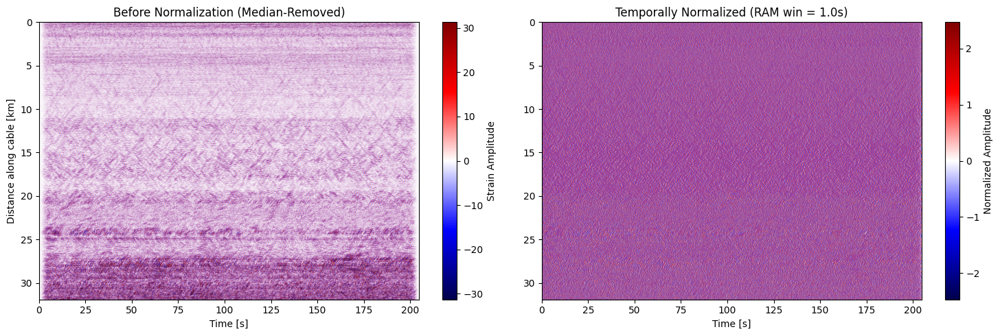

In [12]:
# Set RAM window length (seconds)
# If 0.0, the function applies 1-bit normalization.
ram_win = 1.0  

# Apply temporal normalization (Running Absolute Mean)
x_tem_norm = temporal_normalization(x_med_removed, fs=fs, window_time=ram_win)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# 1. Before Normalization
im1 = ax1.imshow(x_med_removed, aspect='auto', 
                 extent=[t_axis[0], t_axis[-1], x_axis[-1], x_axis[0]],
                 vmin=-filtered_clip, vmax=filtered_clip, cmap='seismic')
ax1.set_title("Before Normalization (Median-Removed)")
ax1.set_xlabel("Time [s]")
ax1.set_ylabel("Distance along cable [km]")
fig.colorbar(im1, ax=ax1, label="Strain Amplitude")

# 2. After Normalization
norm_clip = np.percentile(np.abs(x_tem_norm), 99)

im2 = ax2.imshow(x_tem_norm, aspect='auto', 
                 extent=[t_axis[0], t_axis[-1], x_axis[-1], x_axis[0]],
                 vmin=-norm_clip, vmax=norm_clip, cmap='seismic')
ax2.set_title(f"Temporally Normalized (RAM win = {ram_win}s)")
ax2.set_xlabel("Time [s]")
fig.colorbar(im2, ax=ax2, label="Normalized Amplitude")

plt.tight_layout()
plt.show()

In [13]:
# Set Whitening Parameters
is_spectral_whitening = True
window_freq = 0.0   # 0.0 = phase-only whitening; > 0 = running-mean amplitude whitening

device = torch.device("cpu")
X = torch.as_tensor(x_tem_norm, dtype=torch.float32, device=device)
nch, nt = X.shape

if is_spectral_whitening:
    # Choose FFT length (power-of-two is optimal for speed)
    # Assuming nextpow2 is imported from src.utils
    nfft = nextpow2(nt)
    df = fs / nfft  # Hz per frequency bin

    # Real FFT along the time axis
    R = torch.fft.rfft(X, n=nfft, dim=-1)

    # Apply spectral whitening (from our custom function)
    Rw = spectral_whitening(
        rfftdata=R,
        df=float(df),
        window_freq=float(window_freq),
        f1=float(f1),
        f2=float(f2),
    )

    # Inverse FFT back to time domain, and crop padded values
    Xw = torch.fft.irfft(Rw, n=nfft, dim=-1)[..., :nt]
else:
    Xw = X

x_whiten = Xw.detach().cpu().numpy().astype(np.float32, copy=False)

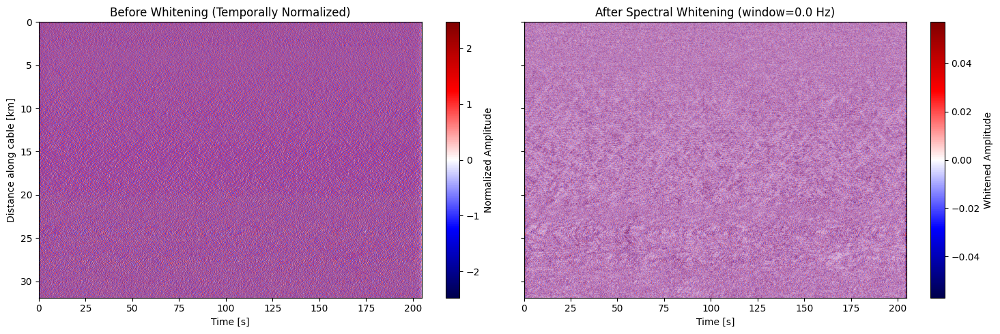

In [14]:
# ---------------------------------------------------------
# 1. Visualization: Wavefield Before vs. After Whitening
# ---------------------------------------------------------
clip0 = np.percentile(np.abs(x_tem_norm), 99)
clip1 = np.percentile(np.abs(x_whiten), 99)

fig, axes = plt.subplots(1, 2, figsize=(15, 5), sharey=True)

# 1. Before Whitening
im0 = axes[0].imshow(x_tem_norm, aspect="auto", 
                     extent=[t_axis[0], t_axis[-1], x_axis[-1], x_axis[0]],
                     vmin=-clip0, vmax=clip0, cmap="seismic")
axes[0].set_title("Before Whitening (Temporally Normalized)")
axes[0].set_xlabel("Time [s]")
axes[0].set_ylabel("Distance along cable [km]")
fig.colorbar(im0, ax=axes[0], label="Normalized Amplitude")

# 2. After Spectral Whitening
im1 = axes[1].imshow(x_whiten, aspect="auto", 
                     extent=[t_axis[0], t_axis[-1], x_axis[-1], x_axis[0]],
                     vmin=-clip1, vmax=clip1, cmap="seismic")
axes[1].set_title(f"After Spectral Whitening (window={window_freq} Hz)")
axes[1].set_xlabel("Time [s]")
fig.colorbar(im1, ax=axes[1], label="Whitened Amplitude")

plt.tight_layout()
plt.show()

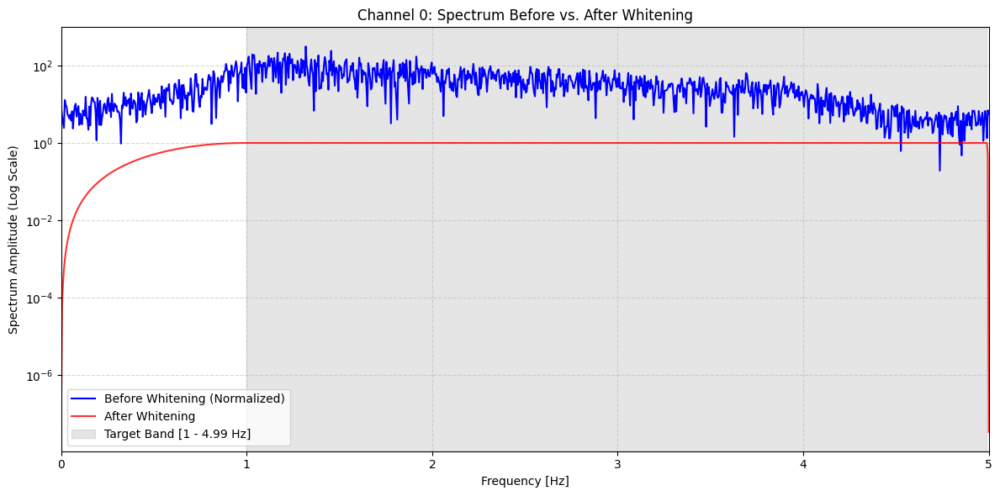

In [ ]:
# ---------------------------------------------------------
# 2. Visualization: Single Channel Spectrum Check
# ---------------------------------------------------------
ch = 0
freq = np.fft.rfftfreq(nfft, d=1.0/fs)
A0 = np.abs(np.fft.rfft(x_tem_norm[ch], n=nfft))
A1 = np.abs(np.fft.rfft(x_whiten[ch], n=nfft))

plt.figure(figsize=(12, 6))
plt.semilogy(freq, A0 + 1e-12, label="Before Whitening (Normalized)", color='blue')
plt.semilogy(freq, A1 + 1e-12, label="After Whitening", color='red', alpha=0.8)
plt.axvspan(f1, f2, alpha=0.2, color='gray', label=f"Target Band [{f1} - {f2} Hz]")

plt.xlim(0, fs / 2.0) 

plt.xlabel("Frequency [Hz]")
plt.ylabel("Spectrum Amplitude (Log Scale)")
plt.title(f"Channel {ch}: Spectrum Before vs. After Whitening")
plt.legend()
plt.grid(True, which="both", ls="--", alpha=0.5)
plt.tight_layout()
plt.show()

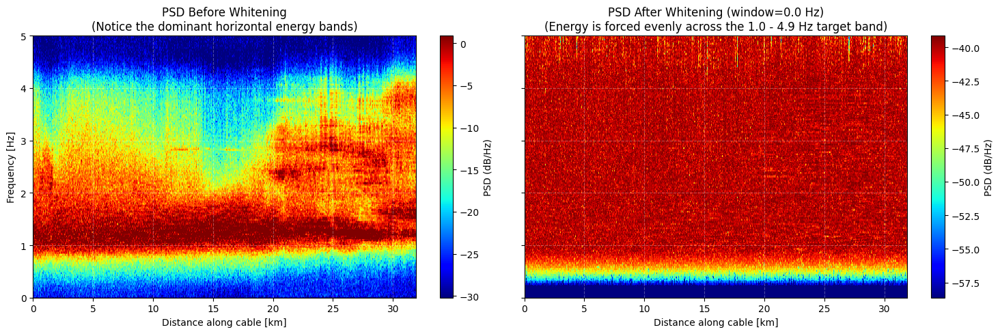

In [16]:
# ---------------------------------------------------------
# 3. Visualization: Full Array PSD Check (Space-Frequency)
# ---------------------------------------------------------
# 1. Calculate PSD Before Whitening (Temporally Normalized Data)
# Note: Using nperseg=512 for a good balance of frequency vs. time resolution
freqs_b, psd_b = welch(x_tem_norm, fs=fs, nperseg=512, axis=-1)
power_db_b = 10 * np.log10(psd_b + 1e-12)

# 2. Calculate PSD After Whitening
freqs_w, psd_w = welch(x_whiten, fs=fs, nperseg=512, axis=-1)
power_db_w = 10 * np.log10(psd_w + 1e-12)

fmin_plot, fmax_plot = 0, fs / 2.0  
freq_mask = (freqs_w >= fmin_plot) & (freqs_w <= fmax_plot)

# Create 2D meshgrid for pcolormesh using x_axis (Distance in km)
X_grid, Y_grid = np.meshgrid(x_axis, freqs_w[freq_mask])

# Extract masked data for both
power_plot_b = power_db_b[:, freq_mask]
power_plot_w = power_db_w[:, freq_mask]

# Calculate independent color limits (whitening changes the absolute scale dramatically)
vmin_b, vmax_b = np.percentile(power_plot_b, 5), np.percentile(power_plot_b, 95)
vmin_w, vmax_w = np.percentile(power_plot_w, 5), np.percentile(power_plot_w, 95)

fig, axes = plt.subplots(1, 2, figsize=(15, 5), sharey=True)

# 1. Before Whitening
mesh0 = axes[0].pcolormesh(X_grid, Y_grid, power_plot_b.T, cmap='jet', shading='auto', vmin=vmin_b, vmax=vmax_b)
fig.colorbar(mesh0, ax=axes[0], label='PSD (dB/Hz)')
axes[0].set_ylim(fmin_plot, fmax_plot)
axes[0].set_xlabel('Distance along cable [km]')
axes[0].set_ylabel('Frequency [Hz]')
axes[0].set_title('PSD Before Whitening\n(Notice the dominant horizontal energy bands)')
axes[0].grid(True, which='both', color='white', linestyle='--', alpha=0.3)

# 2. After Whitening
mesh1 = axes[1].pcolormesh(X_grid, Y_grid, power_plot_w.T, cmap='jet', shading='auto', vmin=vmin_w, vmax=vmax_w)
fig.colorbar(mesh1, ax=axes[1], label='PSD (dB/Hz)')
axes[1].set_xlabel('Distance along cable [km]')
axes[1].set_title(f'PSD After Whitening (window={window_freq} Hz)\n(Energy is forced evenly across the 1.0 - 4.9 Hz target band)')
axes[1].grid(True, which='both', color='white', linestyle='--', alpha=0.3)

plt.tight_layout()
plt.show()

In [ ]:
import time
import numpy as np
import torch
from pathlib import Path

# Custom module imports
from src.ani import preprocess, TorchCrossCorrelation, whiten_per_segment_torch
from src.utils import convert_to_tensor, nextpow2

# ---------------------------------------------------------
# 1. Configuration & Constants (Offshore Scholte Wave Profile)
# ---------------------------------------------------------
out_dir = Path("../data/ncf_raw_notebook").resolve()
out_dir.mkdir(parents=True, exist_ok=True)

# Processing Parameters
fs_raw = 10.0           # 10 Hz sampling
f1, f2 = 1.0, 4.9       # Scholte wave band
Decimation = 1
diff = False            # Strain
ram_win_sec = 1.0       # 1s Running Absolute Mean

# CC Parameters
is_spectral_whitening = True
window_freq = 0.0       # Phase-only
max_lag = 10.0          # +/- 20 seconds lag
xcorr_seg = 204.8       # 2048 samples @ 10Hz

vs_idx = 0              # Virtual Source at Channel 0
device = torch.device("cpu")

# ---------------------------------------------------------
# 2. Helper Functions
# ---------------------------------------------------------
def _lag_slice_conv(npts_seg, npts_lag):
    """Slices the full cross-correlation for Conventional mode."""
    center = npts_seg - 1
    return center - npts_lag, center + npts_lag + 1

# ---------------------------------------------------------
# 3. Main Processing Loop & Benchmark
# ---------------------------------------------------------
for das_path_str in das_paths:
    das_path = Path(das_path_str).expanduser().resolve()
    print(f"\n" + "="*50)
    print(f"Processing File: {das_path.name}")
    print("="*50)

    # Load Raw Data
    das = np.load(das_path)
    X_raw = das["data"].astype(np.float32, copy=False)
    dt = float(das["dt"])
    nch, npts = X_raw.shape
    fs_proc = fs_raw / float(Decimation)

    # A. Preprocessing
    print("[*] Preprocessing: Filtering and Normalizing...")
    X_proc = preprocess(
        x=X_raw, fs_raw=fs_raw, f1=f1, f2=f2,
        decimation=Decimation, diff=diff, ram_win=ram_win_sec
    ).astype(np.float32, copy=False)

    # B. Geometry setup
    npts_lag = int(round(max_lag * fs_proc))
    npts_seg = int(round(xcorr_seg * fs_proc))
    npts_new = (X_proc.shape[1] // npts_seg) * npts_seg
    nseg = npts_new // npts_seg
    
    if nseg == 0: continue
    X_proc = X_proc[:, :npts_new]

    # C. Spectral Whitening (Manual per-segment)
    X_t = convert_to_tensor(X_proc, device=device)
    if is_spectral_whitening:
        print(f"[*] Spectral Whitening: Phase-only (window={window_freq} Hz)")
        X_t = whiten_per_segment_torch(
            X_t, fs_proc=fs_proc, npts_seg=npts_seg,
            window_freq_hz=window_freq, f1=f1, f2=f2
        )

    # D. Prepare Batches for Benchmarking
    src_trace = X_t[vs_idx:vs_idx+1, :]
    data1 = src_trace.expand(nch, -1).reshape(nch * nseg, npts_seg).contiguous()
    data2 = X_t.reshape(nch * nseg, npts_seg).contiguous()

    # E. Initialize Models
    print("\n[*] --- Initializing CC Engines ---")
    
    # Conventional mode (requires manual slicing later)
    model_conv = TorchCrossCorrelation(
        mode="conventional", max_lag_samples=None,
        is_spectral_whitening=False, v1_fft_snap_pow2=True
    ).to(device)
    
    # V1 mode (requires max_lag_samples and returns sliced window automatically)
    model_v1 = TorchCrossCorrelation(
        mode="v1", max_lag_samples=npts_lag,
        is_spectral_whitening=False, v1_fft_snap_pow2=True
    ).to(device)

    # F. Run Benchmarks
    print("[*] Benchmarking Conventional Mode...")
    t0 = time.perf_counter()
    with torch.inference_mode():
        cc_raw_conv = model_conv(data1, data2)
    t1 = time.perf_counter()
    time_conv = t1 - t0

    print("[*] Benchmarking V1 Mode...")
    t2 = time.perf_counter()
    with torch.inference_mode():
        cc_raw_v1 = model_v1(data1, data2)
    t3 = time.perf_counter()
    time_v1 = t3 - t2  

    print(f"\n[*] --- Benchmark Results for {das_path.name} ---")
    print(f"    Conventional: {time_conv:.4f}s")
    print(f"    V1 Mode:      {time_v1:.4f}s")
    print(f"    V1 Speedup:   {time_conv/time_v1:.2f}x")

    # G. Stack and Save (Using V1 Output)
    print(f"[*] Stacking {nseg} segments...")
    # CC_sum shape: (nch, 2*npts_lag + 1)
    cc_sum = cc_raw_v1.reshape(nch, nseg, -1).sum(dim=1)
    cc_final = cc_sum.detach().cpu().numpy() / float(nseg)

    out_name = das_path.name.replace(".npz", f"_cc_vs{vs_idx:04d}_v1.npy")
    np.save(out_dir / out_name, cc_final)
    print(f"[+] Saved NCF to: {out_name} | Shape: {cc_final.shape}")

print("\nProcessing Complete.")